##***DeepFake Detection Using Deep Learning***




## **Setup and Library Imports**

In [1]:
import os
import torch
from torch import nn
import random
from torch.utils.data import DataLoader
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
from tqdm.notebook import tqdm

In [2]:
seed=40302
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = True

In [3]:
import os
os.chdir('/kaggle/input/psoscripts')

In [4]:
os.getcwd()

'/kaggle/input/psoscripts'

## **Helper Functions**

In [5]:
from src.utils import *

## **Data Reading, Splitting and Loading**

In [6]:
from src.dataset import *

In [7]:
def load_data2():

    # load datasets from csv and folders
    # 1. DFDC
    dfdc_folders = glob("/kaggle/input/deepfake-detection-faces*")
    dfdc_folders = sorted(dfdc_folders, key=lambda x: x)
    all_dataframes = []
    for train_dir in dfdc_folders:
        df = pd.read_csv(os.path.join(train_dir, "metadata.csv"))
        df["path"] = df["filename"].apply(lambda x: os.path.join(train_dir, x.split(".")[0]))
        all_dataframes.append(df)

    dfdc_df = pd.concat(all_dataframes, ignore_index=True, sort=False)
    dfdc_df["origin"] = "dfdc"
    dfdc_df.drop(["split", "original"], axis=1, inplace=True)

    # 2. CelebDF
    celeb_df = pd.read_csv("/kaggle/input/celebfaces/celeb_metadata.csv")
    celeb_df["path"] = celeb_df["Unnamed: 0"].apply(
        lambda x: os.path.join("/kaggle/input/celebfaces/CelebDF-v2/faces", x.split(".")[0])
    )
    celeb_df.drop(["img_dir", "fullpath"], axis=1, inplace=True)
    celeb_df.rename(columns={"Unnamed: 0": "filename"}, inplace=True)
    celeb_df = celeb_df[["filename", "label", "path", "origin"]]
    df2 = pd.read_csv(
        "/kaggle/input/celebfaces/CelebDF-v2/List_of_testing_videos.txt", delimiter=" ", header=None
    )
    df2[1] = df2[1].apply(lambda s: s.split("/")[-1])
    test_celeb = celeb_df.loc[celeb_df.filename.isin(df2[1].tolist())].reset_index(drop=True)
    celeb_df.drop(test_celeb.index, inplace=True)
    celeb_df.drop(celeb_df[celeb_df["filename"] == "00233.mp4"].index, inplace=True)
    celeb_df.reset_index(drop=True, inplace=True)

    # 3 . Youtube Faces Extracted
    ytf_df = pd.read_csv("/kaggle/input/youtube-faces-extracted/youtube_faces_50f.csv")
    ytf_df["label"] = "REAL"
    ytf_df["origin"] = "ytf"
    ytf_df["path"] = ytf_df["videoID"].apply(
        lambda x: os.path.join("/kaggle/input/youtube-faces-extracted/faces", x)
    )
    ytf_df.head()

    ytf_df.drop(
        [
            "Unnamed: 0",
            "personName",
            "imageHeight",
            "imageWidth",
            "videoDuration",
            "averageFaceSize",
            "numVideosForPerson",
        ],
        axis=1,
        inplace=True,
    )
    ytf_df.rename(columns={"videoID": "filename"}, inplace=True)
    ytf_df = ytf_df[["filename", "label", "path", "origin"]]
    x = [False for n in range(len(ytf_df.path))]
    for i, path in enumerate(ytf_df.path.tolist()):
        already_present_count = len(glob(path + "/*"))
        if already_present_count >= 50:
            x[i] = True
    ytf_df = ytf_df[x].reset_index(drop=True)

    # Separate test dataset before duplicate real frames from celebdf and dfdc

    df = pd.concat([dfdc_df, celeb_df, ytf_df], ignore_index=True, sort=False)
    df["frames"] = 1
    df["inv_frame"] = 0

    _, _test = get_split(df, 0.2)
    test_df = df.loc[_test, :]
    test_df.reset_index(drop=True, inplace=True)

    df.drop(_test, inplace=True)
    df.reset_index(drop=True, inplace=True)

    # get validation set before duplications.
    train_idx, val_idx = get_split(df, 0.2)
    train_df = df.loc[train_idx, :].reset_index(drop=True)
    valid_df = df.loc[val_idx, :].reset_index(drop=True)

    # duplicate data labeled real in Dfdc and Celebdf
    real_dfdc = train_df[
        (train_df["label"] == "REAL") & (train_df["origin"] == "dfdc")
    ].reset_index(drop=True)

    real_celeb = train_df[
        (train_df["label"] == "REAL") & (train_df["origin"] == "CelebDF-v2")
    ].reset_index(drop=True)

    for i in range(2, 4):
        if i <= 3:
            real_celeb.frames = i
            real_celeb_i = real_celeb.copy()
            real_celeb_i.inv_frame = 1
            train_df = pd.concat([train_df, real_celeb_i], ignore_index=True, sort=False)
        real_dfdc.frames = i
        real_dfdc_i = real_dfdc.copy()
        real_dfdc_i.inv_frame = 1
        train_df = pd.concat([train_df, real_dfdc_i], ignore_index=True, sort=False)

    # undersample fakes to have around 50-50% of training samples
    train_df.drop(
        train_df[(train_df["label"] == "FAKE") & (train_df["origin"] == "dfdc")].sample(4000).index,
        inplace=True,
    )

    train_df.drop(
        train_df[(train_df["label"] == "FAKE") & (train_df["origin"] == "CelebDF-v2")]
        .sample(1300)
        .index,
        inplace=True,
    )
    train_df.reset_index(drop=True, inplace=True)

    valid_df.drop(
        valid_df[(valid_df["label"] == "FAKE") & (valid_df["origin"] == "dfdc")].sample(1000).index,
        inplace=True,
    )

    valid_df.drop(
        valid_df[(valid_df["label"] == "FAKE") & (valid_df["origin"] == "CelebDF-v2")]
        .sample(400)
        .index,
        inplace=True,
    )
    valid_df.reset_index(drop=True, inplace=True)

    return train_df, valid_df, test_df, test_celeb

In [8]:
train_df, valid_df, _, _ = load_data2()

In [9]:
_, pso_index = get_split(train_df, size=0.05)
train_pso = train_df.loc[pso_index, :]
train_pso.reset_index(drop=True, inplace=True)
train_pso.label.value_counts()

REAL    189
FAKE    178
Name: label, dtype: int64

In [10]:
train_pso

,filename,label,path,origin,frames,inv_frame
0,id53_0002.mp4,REAL,/kaggle/input/celebfaces/CelebDF-v2/faces/id53...,CelebDF-v2,3,1
1,bmhghysucl.mp4,FAKE,/kaggle/input/deepfake-detection-faces-part-0-...,dfdc,1,0
2,gvwsgyexpl.mp4,REAL,/kaggle/input/deepfake-detection-faces-part-5-...,dfdc,1,0
3,id0_id28_0009.mp4,FAKE,/kaggle/input/celebfaces/CelebDF-v2/faces/id0_...,CelebDF-v2,1,0
4,id46_id41_0001.mp4,FAKE,/kaggle/input/celebfaces/CelebDF-v2/faces/id46...,CelebDF-v2,1,0
...,...,...,...,...,...,...
362,id8_id7_0007.mp4,FAKE,/kaggle/input/celebfaces/CelebDF-v2/faces/id8_...,CelebDF-v2,1,0
363,id61_0000.mp4,REAL,/kaggle/input/celebfaces/CelebDF-v2/faces/id61...,CelebDF-v2,2,1
364,kdzihtzpkr.mp4,REAL,/kaggle/input/deepfake-detection-faces-part-5-...,dfdc,3,1
365,00181.mp4,REAL,/kaggle/input/celebfaces/CelebDF-v2/faces/00181,CelebDF-v2,2,1


In [11]:
_, pso_index = get_split(valid_df, size=0.25)
valid_pso = valid_df.loc[pso_index, :]
valid_pso.reset_index(drop=True, inplace=True)
valid_pso.label.value_counts()

FAKE    204
REAL    121
Name: label, dtype: int64

In [12]:
train_pso.head()

,filename,label,path,origin,frames,inv_frame
0,id53_0002.mp4,REAL,/kaggle/input/celebfaces/CelebDF-v2/faces/id53...,CelebDF-v2,3,1
1,bmhghysucl.mp4,FAKE,/kaggle/input/deepfake-detection-faces-part-0-...,dfdc,1,0
2,gvwsgyexpl.mp4,REAL,/kaggle/input/deepfake-detection-faces-part-5-...,dfdc,1,0
3,id0_id28_0009.mp4,FAKE,/kaggle/input/celebfaces/CelebDF-v2/faces/id0_...,CelebDF-v2,1,0
4,id46_id41_0001.mp4,FAKE,/kaggle/input/celebfaces/CelebDF-v2/faces/id46...,CelebDF-v2,1,0


## **Run PSO optimization loop**

In [13]:
from src.models.deepfake_detectors import Efficientnet_GRU_Model
from src.train_val_funcs import train_epoch, run_inference
from pso import *

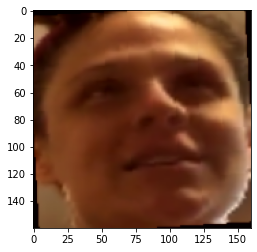

In [14]:
#preprocess the data
train_data = VideoDataset(train_pso, 50, transform = train_transforms(160))
val_data = VideoDataset(valid_pso, 50, transform = test_transforms(160))

#load the data into dataloaders
train_loader = DataLoader(train_data, batch_size = 4, shuffle = True, num_workers = 0)
valid_loader = DataLoader(val_data, batch_size = 4, shuffle = True, num_workers = 0)
#plot the data
image,label = train_data[1]
im_plot(image[1,:,:,:])

In [15]:
#train function for Efficient_GRU_Model
def train_epoch(epoch, data_loader, model, criterion, optimizer):
    model.train()
    losses = AverageMeter()
    accuracies = AverageMeter()
    t = []
    pbar = tqdm(enumerate(data_loader), total=len(data_loader))
    
    for i, (inputs, targets) in pbar:
        
        targets = targets.type(torch.cuda.LongTensor)
        inputs = inputs.cuda()
        _,outputs = model(inputs)
        
        loss  = criterion(outputs,targets.type(torch.cuda.LongTensor))
        acc = calculate_accuracy(outputs, targets.type(torch.cuda.LongTensor))
        losses.update(loss.item(), inputs.size(0))
        accuracies.update(acc, inputs.size(0))
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #add comment to progress bar 
        description = f'epoch {epoch} loss: {losses.avg:.4f} acc: {accuracies.avg:.2f}'   
        pbar.set_description(description)
    
    return losses.avg,accuracies.avg

#test function for Efficient_GRU_Model
def run_inference(model, data_loader ,criterion):
 #   print('Testing')
    model.eval()
    losses = AverageMeter()
    accuracies = AverageMeter()
    pred = []
    true = []
    count = 0
    with torch.no_grad():
        pbar = tqdm(enumerate(data_loader), total=len(data_loader))

        for i, (inputs, targets) in pbar:

            targets = targets.cuda().type(torch.cuda.FloatTensor)
            inputs = inputs.cuda()
            _,outputs = model(inputs)
            loss = torch.mean(criterion(outputs, targets.type(torch.cuda.LongTensor)))
            acc = calculate_accuracy(outputs,targets.type(torch.cuda.LongTensor))
            _,p = torch.max(outputs,1) 
            true += (targets.type(torch.cuda.LongTensor)).detach().cpu().numpy().reshape(len(targets)).tolist()
            pred += p.detach().cpu().numpy().reshape(len(p)).tolist()
            losses.update(loss.item(), inputs.size(0))
            accuracies.update(acc, inputs.size(0))

            description = f' loss: {losses.avg:.4f} acc: {accuracies.avg:.2f}' 
            pbar.set_description(description)
        print('\nAccuracy {}'.format(accuracies.avg))
    return true,pred,losses.avg,accuracies.avg

In [16]:
os.chdir('/kaggle/working')

In [17]:

def train_function(learning_rate=0.001, dropout_rate=0.3, image_size=112, frames_to_use=50, weight_decay=1e-5):
    #learning rate
    lr = learning_rate
    
    #preprocess the data
    train_data = VideoDataset(train_pso, frames_to_use, image_size, transform = train_transforms(image_size) )
    val_data = VideoDataset(valid_pso, frames_to_use, image_size, transform = test_transforms(image_size) )

    #load the data into dataloaders
    train_loader = DataLoader(train_data, batch_size = 8, shuffle = True, num_workers = 2)
    valid_loader = DataLoader(val_data, batch_size = 8, shuffle = True, num_workers = 2)
    
    #instantiate the model
    model2 = Efficientnet_GRU_Model(num_classes=2, dropout_rate=dropout_rate, bidirectional=True).cuda()
    #number of epochs 
    num_epochs = 5

    optimizer = torch.optim.Adam(model2.parameters(), lr= lr, weight_decay = weight_decay)

    criterion = nn.CrossEntropyLoss().cuda()
    train_loss_avg =[]
    train_accuracy = []
    val_loss_avg = []
    val_accuracy = []
    best_accuracy = 0
    for epoch in range(1,num_epochs+1):
        l, acc = train_epoch(epoch,train_loader,model2,criterion,optimizer)
        train_loss_avg.append(l)
        train_accuracy.append(acc)
        #validation step
        true,pred,tl,t_acc = run_inference(model2,valid_loader,criterion)
        val_loss_avg.append(tl)
        val_accuracy.append(t_acc)
        if t_acc > best_accuracy:
            best_accuracy = t_acc
            torch.save(model2.state_dict(),'effnet_gru_{}.pt'.format(epoch))
    return tl
    

In [18]:
pso = PSO(w=0.75, hyperparam={'learning_rate':[1e-5, 1e-3], 'dropout_rate': [0.1, 0.5], 'image_size': [100, 130], 
                             'frames_to_use': [10,50] }, c1=1.5, c2=1.5, num_particles=8)

In [19]:
pso.run(train_function, generations=15)

generation  0 :

particle params:  [1.823999673884878e-05, 0.4657970177159044, 105.0, 18.0]


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth


  0%|          | 0.00/20.5M [00:00<?, ?B/s]

  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 46.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308
fitness val  0.6493265060278085
personal best  [1.82399967e-05 4.65797018e-01 1.05000000e+02 1.80000000e+01]
global best  [1.82399967e-05 4.65797018e-01 1.05000000e+02 1.80000000e+01]
best score  0.6493265060278085
particle params:  [0.0008785706955793575, 0.2293461632922746, 113.0, 39.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 42.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 39.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.46153846153846
fitness val  0.649244990165417
personal best  [8.78570696e-04 2.29346163e-01 1.13000000e+02 3.90000000e+01]
global best  [8.78570696e-04 2.29346163e-01 1.13000000e+02 3.90000000e+01]
best score  0.649244990165417
particle params:  [0.0005992217454522624, 0.11967992055121046, 113.0, 11.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 42.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923
fitness val  0.4259107226591844
personal best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
global best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
best score  0.4259107226591844
particle params:  [0.0004061363234211806, 0.43360735189171573, 105.0, 26.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 75.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.3076923076923
fitness val  0.6744386095267075
personal best  [4.06136323e-04 4.33607352e-01 1.05000000e+02 2.60000000e+01]
global best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
best score  0.4259107226591844
particle params:  [0.000363701602848052, 0.41367315792663006, 118.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 42.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153
fitness val  0.400201783822133
personal best  [3.63701603e-04 4.13673158e-01 1.18000000e+02 1.80000000e+01]
global best  [3.63701603e-04 4.13673158e-01 1.18000000e+02 1.80000000e+01]
best score  0.400201783822133
particle params:  [0.0005093768750049553, 0.17303671066502013, 108.0, 42.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 75.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923
fitness val  0.4345073323066418
personal best  [5.09376875e-04 1.73036711e-01 1.08000000e+02 4.20000000e+01]
global best  [3.63701603e-04 4.13673158e-01 1.18000000e+02 1.80000000e+01]
best score  0.400201783822133
particle params:  [7.370989104751151e-05, 0.14916608385396632, 122.0, 38.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 61.53846153846154


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923
fitness val  0.3603460024182613
personal best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [0.0005103668475282207, 0.37215819406149286, 105.0, 48.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 47.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.92307692307692
fitness val  0.7056936016449562
personal best  [5.10366848e-04 3.72158194e-01 1.05000000e+02 4.80000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
generation  1 :

particle params:  [1e-05, 0.42123040555676944, 106.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.84615384615385
fitness val  0.6954347041937021
personal best  [1.82399967e-05 4.65797018e-01 1.05000000e+02 1.80000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [0.0008889218797897125, 0.22389394631507767, 118.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 69.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 56.0
fitness val  0.8565042024392348
personal best  [8.78570696e-04 2.29346163e-01 1.13000000e+02 3.90000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [0.0007417965785459768, 0.1, 107.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.92307692307692
fitness val  0.5646092183773335
personal best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [0.0006489768647287929, 0.3499740011322864, 112.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 47.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.61538461538461
fitness val  0.630631604561439
personal best  [6.48976865e-04 3.49974001e-01 1.12000000e+02 1.70000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [0.00032502153228690687, 0.3738170101974118, 119.0, 11.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692
fitness val  0.44182897384350117
personal best  [3.63701603e-04 4.13673158e-01 1.18000000e+02 1.80000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [1.0969436774504256e-05, 0.4113457408540891, 120.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 40.30769230769231
fitness val  0.6952149570905245
personal best  [5.09376875e-04 1.73036711e-01 1.08000000e+02 4.20000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [1e-05, 0.23714983707865384, 127.0, 47.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 60.30769230769231
fitness val  0.6901457403256342
personal best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
global best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
best score  0.3603460024182613
particle params:  [0.00023026318500762633, 0.13770453286027817, 110.0, 49.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.0
fitness val  0.330905786385903
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
generation  2 :

particle params:  [1e-05, 0.27167086026161325, 118.0, 14.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308
fitness val  0.6865158468026381
personal best  [1.82399967e-05 4.65797018e-01 1.05000000e+02 1.80000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [0.0006513289291744798, 0.18233941748606128, 123.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.30769230769231


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 45.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461
fitness val  0.517361560509755
personal best  [6.51328929e-04 1.82339417e-01 1.23000000e+02 1.00000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [0.00011466411773833167, 0.1647548268795797, 115.0, 49.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 66.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616
fitness val  0.4630137416032644
personal best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [0.00015104814634624923, 0.159069155532449, 118.0, 14.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847
fitness val  0.3643483748802772
personal best  [1.51048146e-04 1.59069156e-01 1.18000000e+02 1.40000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [0.00013202923356190946, 0.2013912438084741, 123.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 66.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.6923076923077
fitness val  0.3414317210362508
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [0.00038801308425279456, 0.16175864124835715, 118.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 70.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539
fitness val  0.43367668711222135
personal best  [3.88013084e-04 1.61758641e-01 1.18000000e+02 1.00000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [1.0273664460760905e-05, 0.18599238336156723, 124.0, 40.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 45.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 56.92307692307692
fitness val  0.6881784195166368
personal best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
particle params:  [2.018543811718054e-05, 0.1, 113.0, 49.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 58.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 70.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923
fitness val  0.4112158940388606
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
best score  0.330905786385903
generation  3 :

particle params:  [5.2435266387771036e-05, 0.17299650426668534, 111.0, 19.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077
fitness val  0.32080316616938664
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0001935352080797308, 0.10062263855919928, 110.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308
fitness val  0.424231172479116
personal best  [1.93535208e-04 1.00622639e-01 1.10000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0002753588045177382, 0.20747731162282873, 118.0, 36.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.76923076923077
fitness val  0.6057495547917027
personal best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1, 118.0, 25.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 39.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 55.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 56.30769230769231


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.6923076923077
fitness val  0.6844813051590553
personal best  [1.51048146e-04 1.59069156e-01 1.18000000e+02 1.40000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1.41264970000961e-05, 0.1, 116.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 40.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 61.23076923076923
fitness val  0.6847686778582059
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0005891431619505244, 0.1, 116.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 42.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616
fitness val  0.4516571610707503
personal best  [3.88013084e-04 1.61758641e-01 1.18000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0002300382962583979, 0.1, 106.0, 44.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308
fitness val  0.401260509124169
personal best  [7.37098910e-05 1.49166084e-01 1.22000000e+02 3.80000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0003371048599680456, 0.1, 108.0, 49.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 70.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077
fitness val  0.4809994075848506
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
generation  4 :

particle params:  [8.42617161785993e-05, 0.1, 105.0, 23.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 42.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.23076923076923
fitness val  0.48881745466819176
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1, 102.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923
fitness val  0.6981085153726431
personal best  [1.93535208e-04 1.00622639e-01 1.10000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0004660137655681304, 0.16781209599767527, 110.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 52.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.76923076923077
fitness val  0.6489258523629262
personal best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1, 110.0, 26.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 54.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 47.69230769230769
fitness val  0.6926658707398635
personal best  [1.51048146e-04 1.59069156e-01 1.18000000e+02 1.40000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1, 120.0, 48.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 54.76923076923077
fitness val  0.6869073886137742
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.00048678273044050545, 0.1, 114.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 57.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077
fitness val  0.43063115229973425
personal best  [4.8678273e-04 1.0000000e-01 1.1400000e+02 1.0000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [6.716086169496419e-05, 0.1, 105.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0
fitness val  0.3418169961525844
personal best  [6.71608617e-05 1.00000000e-01 1.05000000e+02 1.80000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.00012248217263686556, 0.12168625213694226, 108.0, 46.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.38461538461539
fitness val  0.3395475451075114
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
generation  5 :

particle params:  [8.090816977760498e-05, 0.15499362920044762, 110.0, 21.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 61.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923
fitness val  0.3669915873500017
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1772600350988704, 118.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 46.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 48.30769230769231
fitness val  0.6917705391003536
personal best  [1.93535208e-04 1.00622639e-01 1.10000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0002832547918119755, 0.10875408523573701, 105.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384
fitness val  0.45401104986667634
personal best  [5.99221745e-04 1.19679921e-01 1.13000000e+02 1.10000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.19798994082978066, 109.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 48.92307692307692
fitness val  0.6926433112071111
personal best  [1.51048146e-04 1.59069156e-01 1.18000000e+02 1.40000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [9.893694817155256e-05, 0.12465688125618045, 114.0, 33.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0
fitness val  0.41307237652631906
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1109028301716015, 112.0, 15.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 57.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 57.53846153846154


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.69230769230769
fitness val  0.6800124056522663
personal best  [4.8678273e-04 1.0000000e-01 1.1400000e+02 1.0000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.13343759064371047, 105.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 50.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 58.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 61.53846153846154
fitness val  0.6869376483330359
personal best  [6.71608617e-05 1.00000000e-01 1.05000000e+02 1.80000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.1751946191746135, 112.0, 35.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.0
fitness val  0.6915077959574186
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
generation  6 :

particle params:  [5.205809114213341e-05, 0.22475981209403306, 115.0, 16.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 58.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923
fitness val  0.38472822134311385
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [6.1021888887023175e-05, 0.1838327401521784, 125.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923
fitness val  0.33188505181899436
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.00013932140961675857, 0.10857660028082504, 113.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539
fitness val  0.42478833308586705
personal best  [1.3932141e-04 1.0857660e-01 1.1300000e+02 1.0000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [6.96179868529992e-05, 0.26892335229400655, 119.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 39.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 51.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0
fitness val  0.4177821494065798
personal best  [1.51048146e-04 1.59069156e-01 1.18000000e+02 1.40000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.00015120833810691232, 0.19793271854292138, 118.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077
fitness val  0.35330845947449024
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.20017672089654875, 111.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 50.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 48.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 61.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 52.30769230769231
fitness val  0.6918225860595704
personal best  [4.8678273e-04 1.0000000e-01 1.1400000e+02 1.0000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1.8179671641089834e-05, 0.18511730460599773, 106.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.53846153846153
fitness val  0.5955936543758099
personal best  [6.71608617e-05 1.00000000e-01 1.05000000e+02 1.80000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1.3525619525468817e-05, 0.18880398327907927, 113.0, 40.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.30769230769231


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 60.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.15384615384616
fitness val  0.6634582693760211
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
generation  7 :

particle params:  [3.070328317447141e-05, 0.20148915768018333, 115.0, 14.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 43.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308
fitness val  0.466939377784729
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [9.668883500814763e-05, 0.1826574499270944, 123.0, 46.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 55.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.3076923076923
fitness val  0.34602006999345924
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [1e-05, 0.130735764134285, 116.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 42.46153846153846
fitness val  0.6930810546875
personal best  [1.3932141e-04 1.0857660e-01 1.1300000e+02 1.0000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.00013546855757734337, 0.18614314580791919, 121.0, 16.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.61538461538461
fitness val  0.4517257632659032
personal best  [1.51048146e-04 1.59069156e-01 1.18000000e+02 1.40000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [6.344261388557132e-05, 0.2275340389811666, 123.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 47.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 55.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616
fitness val  0.40631893543096687
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0002899595174580625, 0.22860820287531688, 113.0, 15.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 60.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692
fitness val  0.40639083830209877
personal best  [2.89959517e-04 2.28608203e-01 1.13000000e+02 1.50000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [9.71059287745063e-05, 0.20364130688553755, 109.0, 25.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077
fitness val  0.32535216690256047
personal best  [9.71059288e-05 2.03641307e-01 1.09000000e+02 2.50000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.0001571349415030412, 0.14380102145785928, 111.0, 29.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847
fitness val  0.34303529801850136
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
generation  8 :

particle params:  [5.71494381394471e-05, 0.1408842745997415, 109.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539
fitness val  0.43698574824401965
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [3.441056269487799e-05, 0.17687781742082673, 110.0, 26.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 40.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923
fitness val  0.4080538929425753
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [5.1560854276895284e-05, 0.1661616097443246, 115.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077
fitness val  0.37200301051139834
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
best score  0.32080316616938664
particle params:  [0.00015797005765414606, 0.1, 112.0, 19.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 54.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.3076923076923
fitness val  0.2967255756488213
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [6.778834997492667e-05, 0.14742757598773265, 113.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616
fitness val  0.4523802243746244
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001570648698069662, 0.22126999395749597, 112.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461
fitness val  0.44970739357746564
personal best  [2.89959517e-04 2.28608203e-01 1.13000000e+02 1.50000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00011097196967469688, 0.1892899023035799, 112.0, 35.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 56.30769230769231


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 75.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0
fitness val  0.45076437069819525
personal best  [9.71059288e-05 2.03641307e-01 1.09000000e+02 2.50000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001907095105193516, 0.13231924985733973, 109.0, 33.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539
fitness val  0.3509930872917175
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
generation  9 :

particle params:  [7.085483027870181e-05, 0.16725266524652882, 109.0, 21.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 45.53846153846154


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.3076923076923
fitness val  0.3594880548578042
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [1e-05, 0.1705699584808217, 109.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 61.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 60.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 49.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 52.30769230769231


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 55.07692307692308
fitness val  0.6910634187551645
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [8.27685926664765e-05, 0.20198985355875076, 114.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 48.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616
fitness val  0.4905249438377527
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00017484618271174806, 0.1, 105.0, 21.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.38461538461539
fitness val  0.3600436139106751
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00016893402825746655, 0.1, 114.0, 23.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.84615384615384
fitness val  0.41007368445969544
personal best  [1.32029234e-04 2.01391244e-01 1.23000000e+02 2.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00021874445913830994, 0.16114410911377436, 112.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0
fitness val  0.3773025708932143
personal best  [2.18744459e-04 1.61144109e-01 1.12000000e+02 1.70000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00012915336885344493, 0.1, 110.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153
fitness val  0.38291106187380275
personal best  [9.71059288e-05 2.03641307e-01 1.09000000e+02 2.50000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00020800161822316583, 0.1, 110.0, 28.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077
fitness val  0.5075195208191872
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
generation  10 :

particle params:  [0.00016217432190174393, 0.12041221543502462, 113.0, 21.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 51.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153
fitness val  0.4248004627227783
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [7.412620580749015e-05, 0.1, 119.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 40.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384
fitness val  0.3454532498579759
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00016158953059856708, 0.1, 113.0, 23.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 43.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.23076923076923
fitness val  0.596295569802706
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00014479792113595435, 0.1, 110.0, 21.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153
fitness val  0.4195123880643111
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00019381094364395013, 0.16152705693628527, 126.0, 30.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 53.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384
fitness val  0.3198068555043294
personal best  [1.93810944e-04 1.61527057e-01 1.26000000e+02 3.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.000232241805362291, 0.1, 112.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 50.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308
fitness val  0.5420091884755172
personal best  [2.18744459e-04 1.61144109e-01 1.12000000e+02 1.70000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001537747343265863, 0.1, 109.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 56.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461
fitness val  0.40809189915657046
personal best  [9.71059288e-05 2.03641307e-01 1.09000000e+02 2.50000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00017771782821730383, 0.1, 112.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077
fitness val  0.4783448498065655
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
generation  11 :

particle params:  [0.00023009422605838568, 0.11497234244263431, 112.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.84615384615384
fitness val  0.45634252227269684
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00013192305523416904, 0.1368367411013386, 127.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.53846153846153
fitness val  0.4708155394517458
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001564037067506366, 0.1, 114.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384
fitness val  0.39290982732406027
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00014940352904650977, 0.1, 117.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 47.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692
fitness val  0.406999010936572
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00017828255591793946, 0.1201816358096796, 100.0, 32.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384
fitness val  0.5584976724477915
personal best  [1.93810944e-04 1.61527057e-01 1.26000000e+02 3.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001876575021211831, 0.1, 112.0, 19.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 38.15384615384615


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923
fitness val  0.43846936913637014
personal best  [2.18744459e-04 1.61144109e-01 1.12000000e+02 1.70000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00014383833170060394, 0.12600861097730537, 110.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 54.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923
fitness val  0.48685712727216574
personal best  [9.71059288e-05 2.03641307e-01 1.09000000e+02 2.50000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001484124200522984, 0.10020816459429793, 112.0, 14.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847
fitness val  0.3782152932423812
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
generation  12 :

particle params:  [0.0002388373030936476, 0.13911426434465163, 110.0, 18.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.61538461538461
fitness val  0.43220191726317775
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00015733527396655285, 0.16064126412566332, 109.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.53846153846154


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153
fitness val  0.4688858869442573
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [1e-05, 0.1, 114.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 64.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 58.46153846153846


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 60.61538461538461
fitness val  0.688697350025177
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00016719372129730105, 0.1, 119.0, 16.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 63.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692
fitness val  0.46290847484882064
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00016328825567120002, 0.137669917019162, 100.0, 26.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 72.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077
fitness val  0.4274724347774799
personal best  [1.93810944e-04 1.61527057e-01 1.26000000e+02 3.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00011177166181670041, 0.1505018239275765, 112.0, 19.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 44.30769230769231


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 74.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847
fitness val  0.3550421007779928
personal best  [1.11771662e-04 1.50501824e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [8.713220923739266e-05, 0.23350992999781653, 112.0, 23.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923
fitness val  0.32225713993494326
personal best  [8.71322092e-05 2.33509930e-01 1.12000000e+02 2.30000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00019739217324757084, 0.12512366262320584, 111.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 41.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 70.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539
fitness val  0.391051825101559
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
generation  13 :

particle params:  [1e-05, 0.1732577651789569, 113.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 57.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 43.69230769230769


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 59.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 57.84615384615385


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 62.15384615384615
fitness val  0.682511222912715
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00014827565486189378, 0.1911413868086846, 110.0, 11.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 69.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 87.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847
fitness val  0.3803122847584578
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [2.2284535572917197e-05, 0.15834761192459146, 113.0, 13.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 45.53846153846154


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 51.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 68.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 75.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.0
fitness val  0.5228595355840829
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001637424493183253, 0.1, 104.0, 22.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 66.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.53846153846153
fitness val  0.47185246435495526
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00017702925798040737, 0.1404975590299976, 100.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 66.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692
fitness val  0.4652212769480852
personal best  [1.93810944e-04 1.61527057e-01 1.26000000e+02 3.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [6.172453109814556e-05, 0.12177919906251375, 112.0, 19.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 50.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692
fitness val  0.39420418973152455
personal best  [1.11771662e-04 1.50501824e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [4.6836585369895375e-05, 0.19198674262809973, 114.0, 27.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 70.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 75.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692
fitness val  0.35378647538331837
personal best  [8.71322092e-05 2.33509930e-01 1.12000000e+02 2.30000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00023731366310412378, 0.1488403567295315, 111.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 69.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 78.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847
fitness val  0.44850739446970134
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
generation  14 :

particle params:  [5.1035462158074616e-05, 0.1, 114.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 37.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 73.84615384615384


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.46153846153847
fitness val  0.344844020490463
personal best  [5.24352664e-05 1.72996504e-01 1.11000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00013498970065142177, 0.16459058595112142, 100.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 65.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 88.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.15384615384616


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077
fitness val  0.37645858491842565
personal best  [6.10218889e-05 1.83832740e-01 1.25000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00024020918635367041, 0.1978747843805106, 112.0, 20.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 67.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.23076923076923
fitness val  0.5362270339635702
personal best  [5.15608543e-05 1.66161610e-01 1.15000000e+02 1.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0001541333961540216, 0.1, 100.0, 21.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 70.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 77.84615384615384
fitness val  0.7360658727700894
personal best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00018997030147756695, 0.12853409465198876, 100.0, 17.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 69.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.38461538461539


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 85.23076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308
fitness val  0.5175241771111122
personal best  [1.93810944e-04 1.61527057e-01 1.26000000e+02 3.00000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00020274462990086794, 0.1124046120894669, 112.0, 19.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 66.46153846153847


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.92307692307692


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 80.3076923076923
fitness val  0.5761938537771886
personal best  [1.11771662e-04 1.50501824e-01 1.12000000e+02 1.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.0002186360993424852, 0.1377275139356694, 112.0, 25.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 75.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 83.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.61538461538461


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 84.0


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 86.76923076923077
fitness val  0.391456554211103
personal best  [8.71322092e-05 2.33509930e-01 1.12000000e+02 2.30000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213
particle params:  [0.00019539203668123212, 0.15378674365732894, 112.0, 10.0]


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 71.6923076923077


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 76.3076923076923


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 79.07692307692308


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 81.53846153846153


  0%|          | 0/46 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]


Accuracy 82.76923076923077
fitness val  0.4066065834577267
personal best  [2.30263185e-04 1.37704533e-01 1.10000000e+02 4.90000000e+01]
global best  [1.57970058e-04 1.00000000e-01 1.12000000e+02 1.90000000e+01]
best score  0.2967255756488213


In [20]:
gbest = [array([5.03028911e-04, 1.15604694e-01, 1.28000000e+02, 4.50000000e+01]), 
         array([5.31482054e-05, 1.00000000e-01, 1.18000000e+02, 2.50000000e+01]), 
         array([5.31482054e-05, 1.00000000e-01, 1.18000000e+02, 2.50000000e+01]), 
         array([4.75104203e-05, 1.30357553e-01, 1.18000000e+02, 2.60000000e+01]), 
         array([4.75104203e-05, 1.30357553e-01, 1.18000000e+02, 2.60000000e+01]), 
         array([4.83686665e-05, 1.31387669e-01, 1.18000000e+02, 2.40000000e+01]), 
         array([4.83686665e-05, 1.31387669e-01, 1.18000000e+02, 2.40000000e+01]), 
         array([8.46712797e-05, 1.37189253e-01, 1.21000000e+02, 1.90000000e+01]), 
         array([8.46712797e-05, 1.37189253e-01, 1.21000000e+02, 1.90000000e+01]), 
         array([8.46712797e-05, 1.37189253e-01, 1.21000000e+02, 1.90000000e+01]), 
         array([8.46712797e-05, 1.37189253e-01, 1.21000000e+02, 1.90000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01]), 
         array([1.08806868e-04, 1.55357928e-01, 1.21000000e+02, 2.20000000e+01])]

NameError: name 'gbest' is not defined

In [ ]:
gbest = pd.DataFrame(pso.gbest, columns=['lr', 'dropout', 'im_size', 'num_frames'])
pbest = [pd.DataFrame(p.pbest, columns=['lr', 'dropout', 'im_size', 'num_frames']) for p in pso.particles]
#pos = [pd.DataFrame(p.pos, columns=['lr', 'dropout', 'im_size', 'num_frames']) for p in pso.particles]
#p = [pd.concat([pbest[i], pos[i]], axis=1) for i in range(len(pbest))]



In [ ]:
import matplotlib as plt
import seaborn as sns

sns.lineplot(data=gbest.loc[:,'lr'])
for i,p in enumerate(pbest):
    p.position = pos[i].loc[:,0]
    sns.lineplot(data=p.loc[:,'lr'] )

In [ ]:
import matplotlib as plt
import seaborn as sns

sns.lineplot(data=gbest.loc[:,'lr'], linewidth=2)
for i,p in enumerate(pbest):
    p.position = pos[i].loc[:,0]
    sns.lineplot(data=p.loc[:,'lr'] )

In [ ]:
sns.lineplot(data=gbest.loc[:,'dropout'], linewidth=2)
for i,p in enumerate(pbest):
    p.position = pos[i].loc[:,0]
    sns.lineplot(data=p.loc[:,'dropout'] )

In [ ]:
sns.lineplot(data=gbest.loc[:,'im_size'], linewidth=2)
for i,p in enumerate(pbest):
    p.position = pos[i].loc[:,0]
    sns.lineplot(data=p.loc[:,'im_size'] )

In [ ]:
sns.lineplot(data=gbest.loc[:,'num_frames'], linewidth=2)
for i,p in enumerate(pbest):
    p.position = pos[i].loc[:,0]
    sns.lineplot(data=p.loc[:,'num_frames'] )

with open('Python.txt', 'rb') as f:
    dict = pickle.load(f)

In [ ]:
import pickle
os.chdir('../')

In [ ]:

file = open('pso_pureeffnet.pickle', 'wb')
pickle.dump((gbest, pbest), file)
file.close()
 
